In [1]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import torch.nn as nn
import torch.optim as optim
from tqdm.notebook import tqdm
import models
from torchsummary import summary
from torch.utils.data import DataLoader
from torchvision import transforms, datasets
from torchvision import utils as vutils

In [2]:
pretrained = True

In [3]:
img_size = 64
ngf = 128  # nb of feature map in generator
ndf = 64  # nb of feature map in dicriminator
nz = 50  # dimension of latent vectorial space
nc = 3  # number of color channels
lr = 0.000001  #learning rate

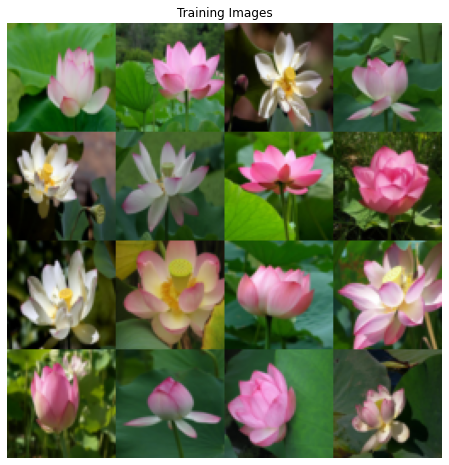

In [4]:

dataroot = 'data'
batch_size = 30

dataset = datasets.ImageFolder(root=dataroot,
                               transform=transforms.Compose([
                                   models.SizeAjuster(img_size),
                                   transforms.ToTensor(),
                                   transforms.Normalize((0.5, 0.5, 0.5),
                                                        (0.5, 0.5, 0.5))
                               ]))

dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

device = torch.device('cuda')

real_batch = next(iter(dataloader))
plt.figure(figsize=(8, 8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(
    np.transpose(
        vutils.make_grid(real_batch[0].to(device)[:16],
                         padding=0,
                         normalize=True,
                         nrow=4).cpu(), (1, 2, 0)))
plt.savefig('outputs/training_example.png')
plt.show()

In [5]:
if pretrained:
    netG = models.getGenerator(
        filename="saved_models/flower_generator_weights.pth",
        nz=nz,
        ngf=ngf,
        img_size=img_size,
        nc=nc).to(device)
else:
    netG = models.getGenerator(nz=nz, ngf=ngf, img_size=img_size, nc=nc)
    netG.apply(models.weights_init).to(device)

summary(netG, input_size=(nz, 1, 1), device=device.type)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
   ConvTranspose2d-1            [-1, 512, 8, 8]       1,638,400
       BatchNorm2d-2            [-1, 512, 8, 8]           1,024
         LeakyReLU-3            [-1, 512, 8, 8]               0
   ConvTranspose2d-4          [-1, 256, 16, 16]       2,097,152
       BatchNorm2d-5          [-1, 256, 16, 16]             512
         LeakyReLU-6          [-1, 256, 16, 16]               0
   ConvTranspose2d-7          [-1, 128, 32, 32]         524,288
       BatchNorm2d-8          [-1, 128, 32, 32]             256
         LeakyReLU-9          [-1, 128, 32, 32]               0
  ConvTranspose2d-10            [-1, 3, 64, 64]           6,144
             Tanh-11            [-1, 3, 64, 64]               0
Total params: 4,267,776
Trainable params: 4,267,776
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forw

In [6]:
if pretrained:
    netD = models.getDiscriminator(
        filename="saved_models/flower_discriminator_weights.pth",
        img_size=img_size,
        ndf=ndf,
        nc=nc).to(device)
else:
    netD = models.getDiscriminator(img_size=img_size, ndf=ndf, nc=nc)
    netD.apply(models.weights_init).to(device)

summary(netD, input_size=(nc, img_size, img_size), device=device.type)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 32, 32]           3,072
         LeakyReLU-2           [-1, 64, 32, 32]               0
            Conv2d-3          [-1, 128, 16, 16]         131,072
       BatchNorm2d-4          [-1, 128, 16, 16]             256
         LeakyReLU-5          [-1, 128, 16, 16]               0
            Conv2d-6            [-1, 256, 8, 8]         524,288
       BatchNorm2d-7            [-1, 256, 8, 8]             512
         LeakyReLU-8            [-1, 256, 8, 8]               0
            Conv2d-9            [-1, 512, 4, 4]       2,097,152
      BatchNorm2d-10            [-1, 512, 4, 4]           1,024
        LeakyReLU-11            [-1, 512, 4, 4]               0
           Conv2d-12              [-1, 1, 1, 1]           8,192
          Sigmoid-13              [-1, 1, 1, 1]               0
Total params: 2,765,568
Trainable param

In [7]:
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(0.5, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(0.5, 0.999))

In [8]:
loss = nn.BCELoss()

fixed_noise = torch.randn(
    64,
    nz,
    1,
    1,
    device=device,
)  # to make an animation of the generator's progress over time

# label convention

real_label = 1.
generated_label = 0.

In [9]:
img_list = []
G_losses = []
D_losses = []
runtime = 0

In [10]:
iters = 0
num_epochs = 1000
runtime += 1
for epoch in tqdm(range(num_epochs)):
    for i, data in enumerate(dataloader, 0):
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z))) = ylogx + (1-y)log(1-x)
        netD.zero_grad()
        # format des batchs
        real_sample = data[0].to(device)
        b_size = real_sample.size(0)
        label = torch.full((b_size, ),
                           real_label,
                           dtype=torch.float,
                           device=device)
        # passage des échantillons réels dans le discriminant
        output = netD(real_sample).view(-1)
        err_D_real = loss(output, label)

        # calcul du gradient en backpropagation
        err_D_real.backward()

        D_x = output.mean().item()  # esperance de D sur les échantillons réels

        # création d'échantillons fake à partir d'un bruit gaussien (autant que d'échantillons réels)
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        fake = netG(noise)
        label.fill_(generated_label)

        # passage des échantillons générés dans le discriminant
        output = netD(fake).view(-1)
        err_D_fake = loss(output, label)

        #calcul du gradient
        err_D_fake.backward()

        err_D = err_D_fake + err_D_real

        # update D
        optimizerD.step()

        # (2) Update G Network : maximize log(D(G(x))) = ylogx + (1-y)log(1-x)

        netG.zero_grad()
        fake = netG(noise)
        label.fill_(real_label)  # fake labels are real for generator cost
        output = netD(fake).view(-1)

        err_G = loss(output, label)
        #calcul du gradient
        err_G.backward()

        # update G
        optimizerG.step()

        G_losses.append(err_G.item())
        D_losses.append(err_D.item())
        if (iters % (len(dataloader) * num_epochs // 20)
                == 0) or ((epoch == num_epochs - 1) and
                          (i == len(dataloader) - 1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(
                vutils.make_grid(fake[:25], padding=0, normalize=True, nrow=5))

        iters += 1

  0%|          | 0/1000 [00:00<?, ?it/s]

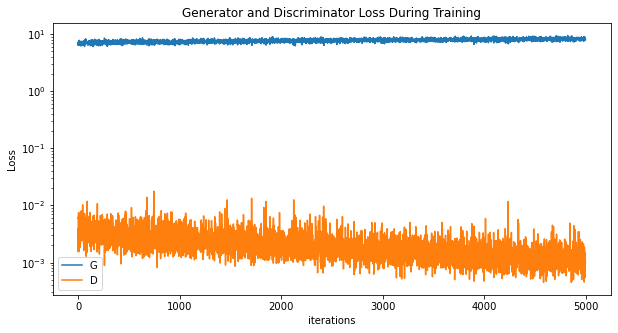

In [11]:
plt.figure(figsize=(10, 5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses, label="G")
plt.plot(D_losses, label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.yscale('log')
plt.legend()
plt.show()

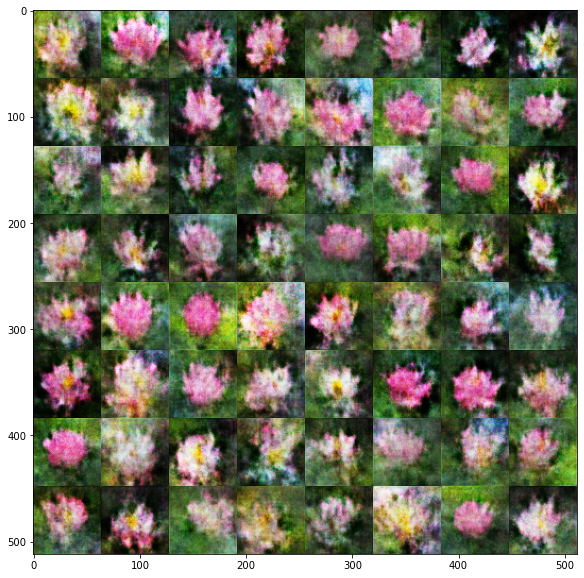

In [12]:
fig = plt.figure(figsize=(10, 10))
fake = netG(fixed_noise)
plt.imshow(
    np.transpose(
        vutils.make_grid(fake[:64].cpu(), padding=0, normalize=True, nrow=8),
        (1, 2, 0)))
plt.savefig("outputs/exemple_output.png")

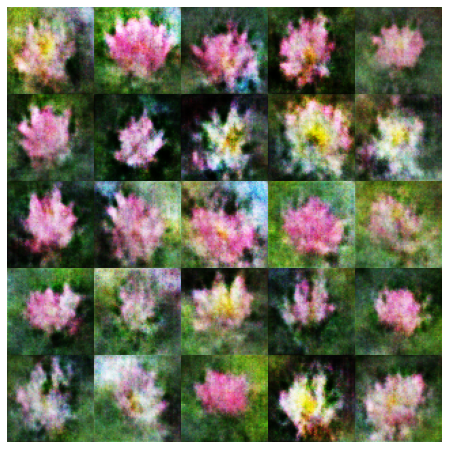

In [13]:
import matplotlib.animation as animation
from IPython.display import HTML

fig = plt.figure(figsize=(8, 8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i, (1, 2, 0)), animated=True)]
       for i in img_list[::runtime]]
ani = animation.ArtistAnimation(fig,
                                ims,
                                interval=100,
                                repeat_delay=200,
                                blit=True)

HTML(ani.to_jshtml())

In [14]:
imgs = (models.unloader(im.clone().squeeze(0)) for im in img_list[::runtime])
img = next(imgs)
img.save(fp='outputs/learning.gif',
         format='GIF',
         append_images=imgs,
         save_all=True,
         duration=200,
         loop=0)

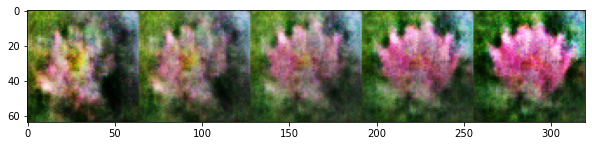

In [15]:
point1 = fixed_noise[0].cpu().detach().numpy()
point2 = fixed_noise[1].cpu().detach().numpy()

lambs = np.linspace(0, 1, 5).reshape(-1, 1)

transition = np.array([point1 * (1 - lamb) + point2 * lamb for lamb in lambs])
transition = transition.reshape(5, nz, 1, 1)
transition = torch.from_numpy(transition).to(device).float()

transition_image = netG(transition).cpu().detach()

plt.figure(figsize=(10, 10))
plt.imshow(
    np.transpose(
        vutils.make_grid(transition_image.cpu(),
                         padding=0,
                         normalize=True,
                         nrow=5), (1, 2, 0)))
plt.savefig('outputs/transition.png')
plt.show()

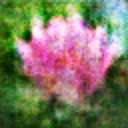

In [16]:
example = models.unloader(fake[1])
example.resize((128, 128))

In [17]:
netG.save("saved_models/flower_generator_weights.pth")
netD.save("saved_models/flower_discriminator_weights.pth")